In [4]:
pip install folium


Defaulting to user installation because normal site-packages is not writeableNote: you may need to restart the kernel to use updated packages.

   ---------------------------------------- 0.0/100.0 kB ? eta -:--:--
   ------- ------------------------------- 20.5/100.0 kB 682.7 kB/s eta 0:00:01
   --------------- ----------------------- 41.0/100.0 kB 393.8 kB/s eta 0:00:01
   ----------------------------------- --- 92.2/100.0 kB 655.4 kB/s eta 0:00:01
   -------------------------------------- 100.0/100.0 kB 641.2 kB/s eta 0:00:00


In [14]:
pip install geopy


Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/125.4 kB ? eta -:--:--
   --- ------------------------------------ 10.2/125.4 kB ? eta -:--:--
   ------------ -------------------------- 41.0/125.4 kB 487.6 kB/s eta 0:00:01
   ------------------- ------------------- 61.4/125.4 kB 544.7 kB/s eta 0:00:01
   -------------------------------------- 125.4/125.4 kB 733.7 kB/s eta 0:00:00
   ---------------------------------------- 0.0/40.3 kB ? eta -:--:--
   ---------------------------------------- 40.3/40.3 kB 940.1 kB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [1]:
# Importing necessary libraries
import pandas as pd
import folium
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
from geopy.distance import geodesic
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV


from sklearn.model_selection import cross_val_score


In [2]:
# Step 1: Load the dataset
data = pd.read_csv(r"D:\New folder\Dataset .csv")

In [3]:
from IPython.display import display
import folium

# Step 2: Visualize distribution on a map
restaurant_map = folium.Map(location=[data['Latitude'].mean(), data['Longitude'].mean()], zoom_start=10)

# Add markers for each restaurant
for index, row in data.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Locality']).add_to(restaurant_map)

# Define most preferred locations
most_preferred_locations = [
    {"name": "Century City Mall, Poblacion, Makati City", "latitude": 14.565443, "longitude": 121.027535},
    {"name": "Little Tokyo, Legaspi Village, Makati City", "latitude": 14.553708, "longitude": 121.014101},
    {"name": "SM Megamall, Ortigas, Mandaluyong City", "latitude": 14.585318, "longitude": 121.056475},
    {"name": "Sofitel Philippine Plaza Manila, Pasay City", "latitude": 14.55299, "longitude": 120.98009},
    {"name": "Kapitolyo, Pasig City", "latitude": 14.572041, "longitude": 121.056532},
    {"name": "UP Town Center, Diliman, Quezon City", "latitude": 14.649503, "longitude": 121.075419},
    {"name": "Little Baguio, San Juan City", "latitude": 14.59889, "longitude": 121.03811},
    {"name": "Nuvali, Don Jose, Santa Rosa", "latitude": 14.237082, "longitude": 121.05704},
    {"name": "Tagaytay City", "latitude": 14.101834, "longitude": 120.951589}
]

# Add markers for most preferred locations with custom icons and labels
for location in most_preferred_locations:
    folium.Marker([location['latitude'], location['longitude']], popup=location['name'], 
                  icon=folium.Icon(color='green', icon='star'), tooltip=location['name']).add_to(restaurant_map)  # Using a star icon and tooltip

# Display the map inline
display(restaurant_map)


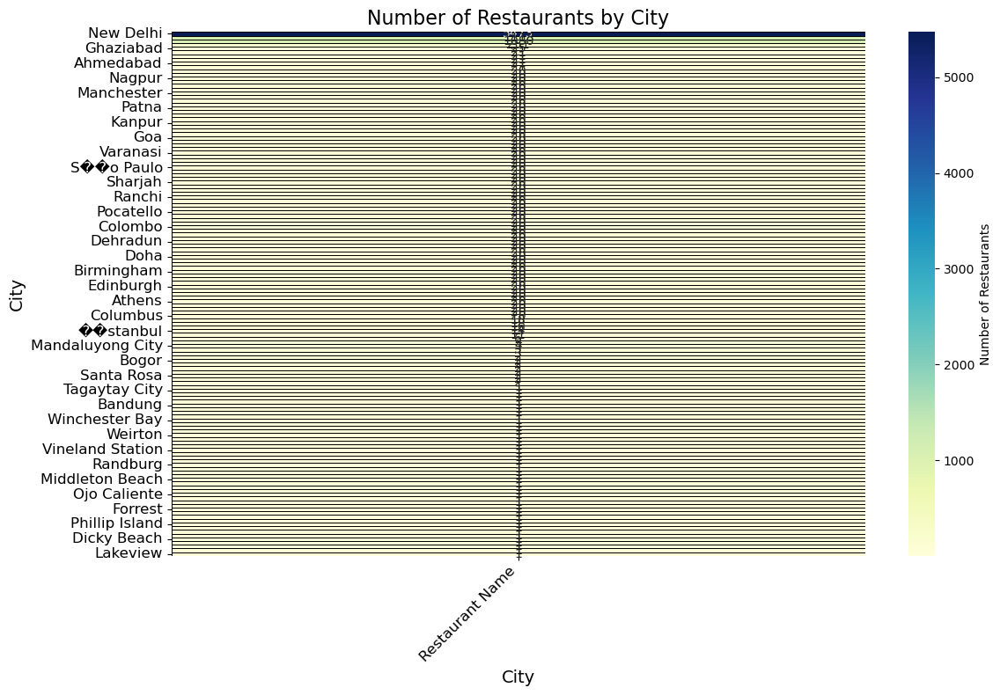

In [4]:
import seaborn as sns

# Step 3: Group restaurants by city or locality and analyze concentration
restaurant_concentration = data.groupby('City')['Restaurant Name'].count().reset_index()

# Create a pivot table for the heatmap
pivot_table = restaurant_concentration.pivot_table(index='City', values='Restaurant Name', aggfunc='sum')

# Sort pivot table by restaurant count
pivot_table = pivot_table.sort_values(by='Restaurant Name', ascending=False)

# Visualize concentration using a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap='YlGnBu', annot=True, fmt='g', linewidths=0.5, linecolor='black', cbar_kws={'label': 'Number of Restaurants'}, annot_kws={"size": 10})
plt.xlabel('City', fontsize=14)  # Increase font size
plt.ylabel('City', fontsize=14)  # Increase font size
plt.title('Number of Restaurants by City', fontsize=16)  # Increase font size
plt.xticks(rotation=45, ha='right', fontsize=12)  # Rotate x-axis labels and increase font size
plt.yticks(rotation=0, fontsize=12)  # Increase font size
plt.tight_layout()
plt.show()


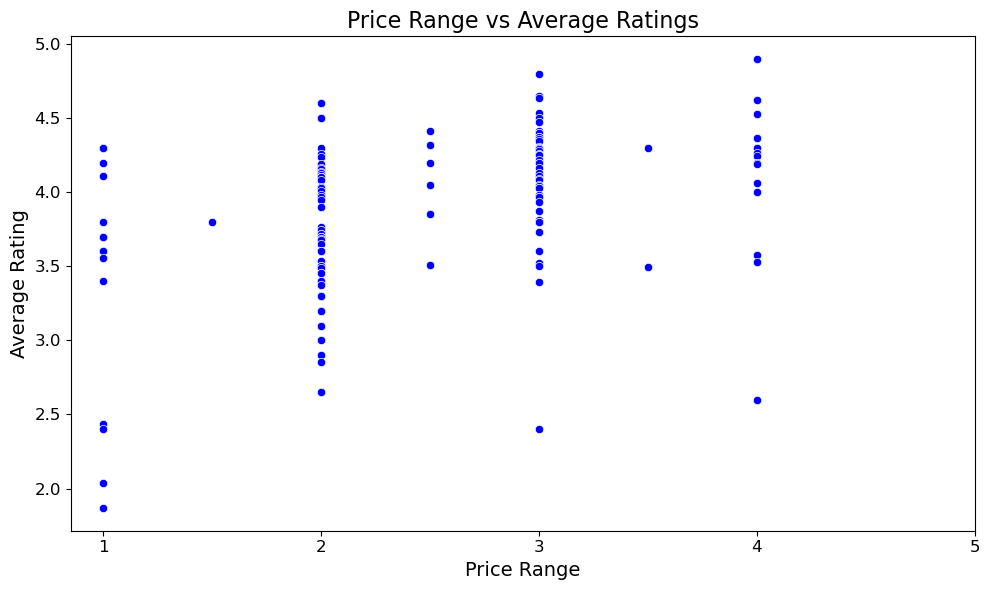

In [5]:
# Step 4: Calculate statistics by city or locality
restaurant_statistics = data.groupby('City').agg({
    'Aggregate rating': 'mean',
    'Cuisines': lambda x: x.value_counts().index[0] if len(x.value_counts()) > 0 else 'Not available',  # Most common cuisine
    'Price range': 'median'
}).reset_index()

# Sort the statistics by average rating
restaurant_statistics = restaurant_statistics.sort_values(by='Aggregate rating', ascending=False)

# Visualize average ratings by city
# Create a scatter plot of Price range vs Aggregate rating
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Price range', y='Aggregate rating', data=restaurant_statistics, color='blue')
plt.xlabel('Price Range', fontsize=14)
plt.ylabel('Average Rating', fontsize=14)
plt.title('Price Range vs Average Ratings', fontsize=16)
plt.xticks(fontsize=12, ticks=range(1, 6))  # Adjust x-axis ticks to represent actual price range values
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


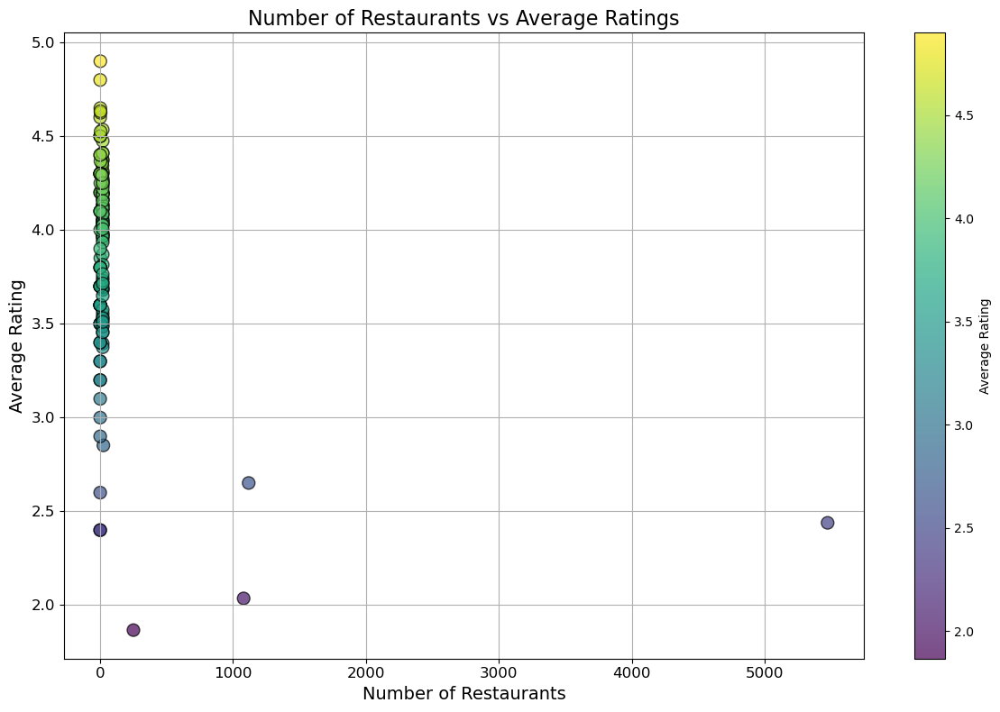

In [6]:
# Merge concentration and statistics dataframes
restaurant_analysis = pd.merge(restaurant_concentration, restaurant_statistics, on='City')

# Plot scatter plots for the number of restaurants vs average ratings
plt.figure(figsize=(12, 8))

# Plot scatter points with larger markers and color based on average rating
plt.scatter(restaurant_analysis['Restaurant Name'], restaurant_analysis['Aggregate rating'], 
            s=100, c=restaurant_analysis['Aggregate rating'], cmap='viridis', alpha=0.7, edgecolors='k')

plt.colorbar(label='Average Rating')  # Add color bar indicating average rating scale

plt.xlabel('Number of Restaurants', fontsize=14)
plt.ylabel('Average Rating', fontsize=14)
plt.title('Number of Restaurants vs Average Ratings', fontsize=16)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.show()
